# Human Kidney Cancer dataset multiome preprocessing

Adaption checking the four different extraction versions, see protocol:
https://cdn.10xgenomics.com/image/upload/v1666737555/support-documents/CG000552_TechnicalNote_ChromiumNucleiIsolationKitDataComparison_Multiome_RevA.pdf

1. Chromium Nuclei Isolation Kit
2. 10X DP, with sorting
3. 10X DP, without sorting
4. Salty EZ lysis protocol

**Solution** : Due to the large batch effects, focus for the analysis only on one sample.

In [1]:
file_path = "../../10X_kidney_data/H_Kidney_Cancer_Chromium_Nuc_Iso_vs_SaltyEZ_vs_ComplexTissueDP_filtered_feature_bc_matrix.h5"

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import muon as mu
import seaborn as sns

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
mdata = mu.read_10x_h5(file_path)
mdata.var_names_make_unique()

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Added `interval` annotation for features from ../../10X_kidney_data/H_Kidney_Cancer_Chromium_Nuc_Iso_vs_SaltyEZ_vs_ComplexTissueDP_filtered_feature_bc_matrix.h5


/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/mudata/_core/mudata.py:445: UserWarning: var_names are not unique. To make them unique, call `.var_names_make_unique`.
  warnings.warn(


In [14]:
mdata

MuData object with n_obs × n_vars = 22772 × 103751
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	22772 x 36601
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
    atac:	22772 x 67150
      var:	'gene_ids', 'feature_types', 'genome', 'interval'

## Filtering the dataset to contain only one experiments

In [15]:
#Split the four different barcodes
mdata.obs["experiment"] = [bc.split("-")[1] for bc in mdata.obs.index]
mdata.obs["experiment"].value_counts()

2    6951
3    6051
4    5317
1    4453
Name: experiment, dtype: int64

In [20]:
mdata = mdata[mdata.obs.experiment=="2"].copy()

## Preprocessing the RNA

In [35]:
rna = mdata.mod['rna']
rna

AnnData object with n_obs × n_vars = 6951 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [36]:
rna.var_names_make_unique()

In [37]:
rna.var['mt'] = rna.var_names.str.startswith('MT-')

In [38]:
sc.pp.calculate_qc_metrics(
    rna, qc_vars=['mt'], inplace=True, percent_top=[20],log1p=True
)

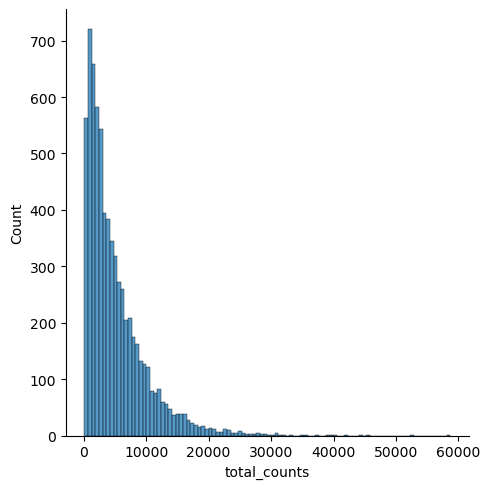

In [39]:
p1 = sns.displot(rna.obs["total_counts"], bins=100, kde=False)

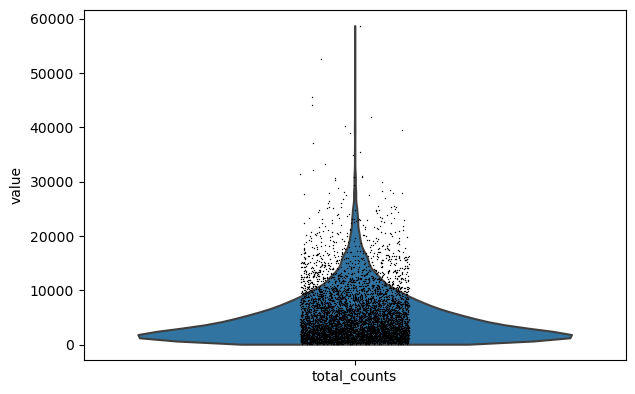

In [40]:
p8 = sc.pl.violin(rna, 'total_counts')

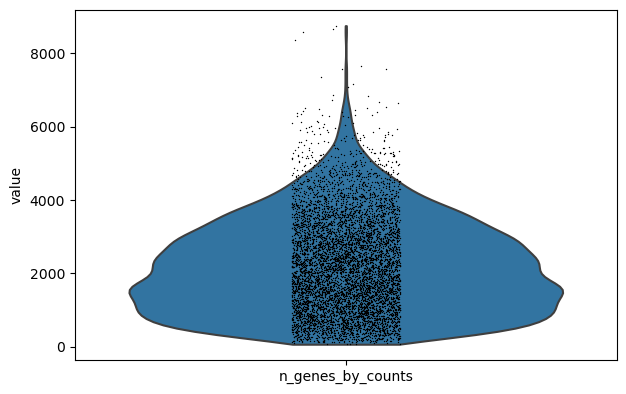

In [41]:
p5 = sc.pl.violin(rna, 'n_genes_by_counts')

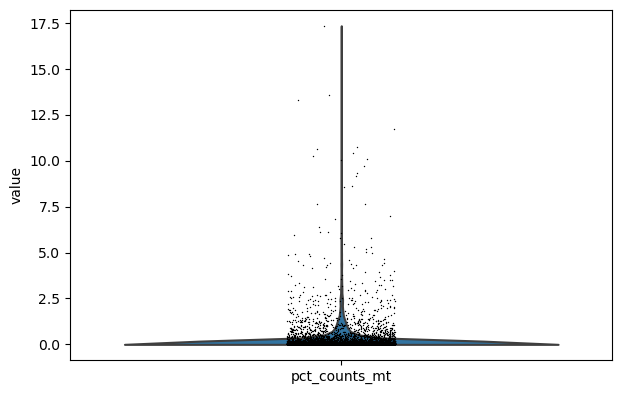

In [42]:
p2 = sc.pl.violin(rna, "pct_counts_mt")

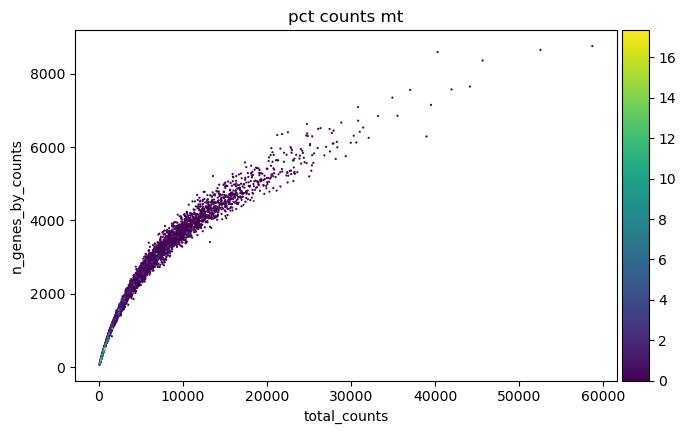

In [43]:
p3 = sc.pl.scatter(rna, "total_counts", "n_genes_by_counts", color="pct_counts_mt",size=10)

In [44]:
rna

AnnData object with n_obs × n_vars = 6951 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [ ]:
#sc.pp.filter_cells(rna, min_genes=300)#300
#sc.pp.filter_cells(rna, max_genes=10000)#10000

In [ ]:
#rna

In [45]:
rna = rna[rna.obs['total_counts'] >= 2000, :]#2000
rna = rna[rna.obs['total_counts'] <= 30000, :]#20000

In [46]:
rna

View of AnnData object with n_obs × n_vars = 4833 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [47]:
rna = rna[rna.obs['pct_counts_mt'] < 10, :]

In [48]:
rna

View of AnnData object with n_obs × n_vars = 4832 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

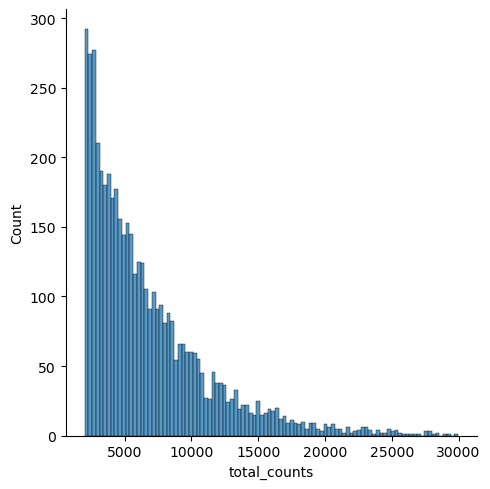

In [49]:
p1 = sns.displot(rna.obs["total_counts"], bins=100, kde=False)

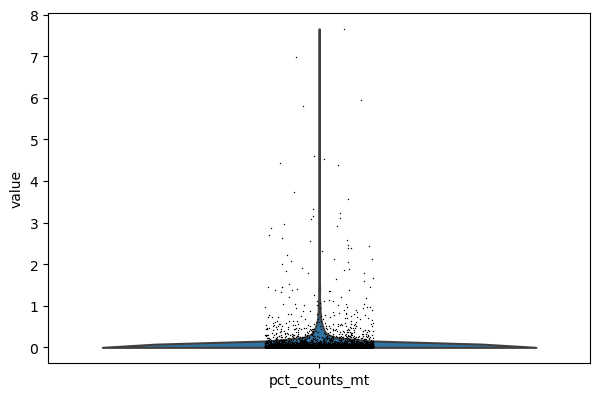

In [50]:
p2 = sc.pl.violin(rna, "pct_counts_mt")

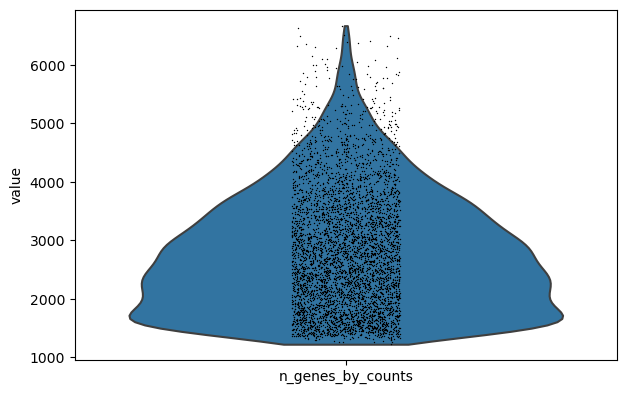

In [51]:
p6 = sc.pl.violin(rna, 'n_genes_by_counts')

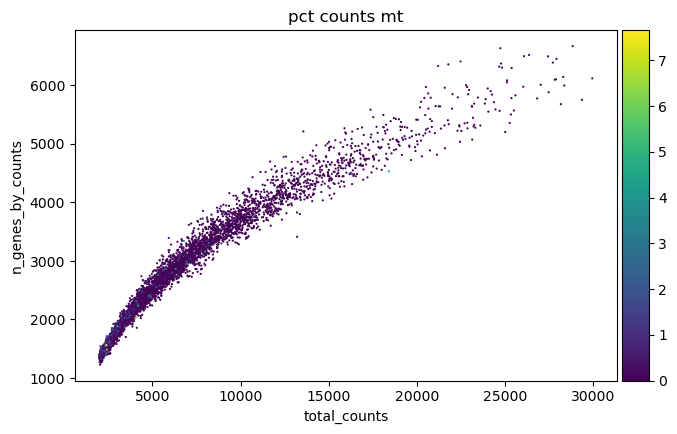

In [52]:
p3 = sc.pl.scatter(rna, "total_counts", "n_genes_by_counts", color="pct_counts_mt",size=10)

In [53]:
sc.pp.normalize_total(rna)
sc.pp.log1p(rna)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [54]:
sc.pp.highly_variable_genes(rna, n_top_genes=2000)

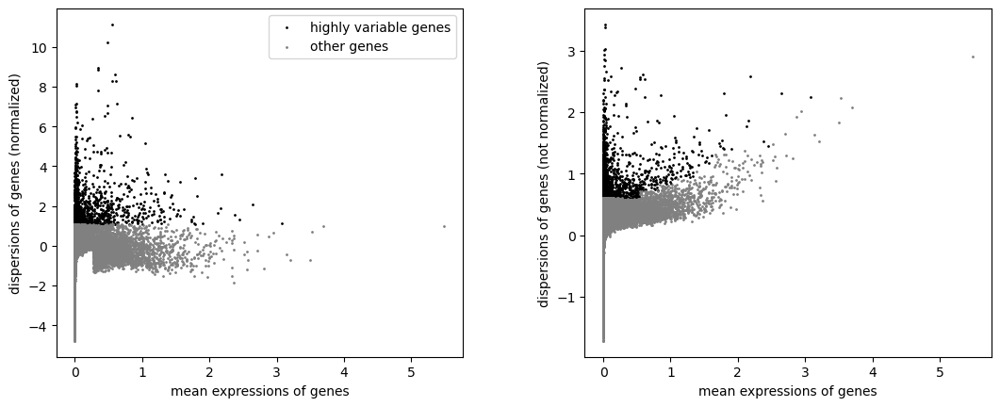

In [55]:
sc.pl.highly_variable_genes(rna)

In [ ]:
#rna = rna[:, rna.var.highly_variable]

In [ ]:
#rna

## Calculate a PCA

In [56]:
sc.pp.scale(rna, max_value=10)

In [57]:
sc.tl.pca(rna)

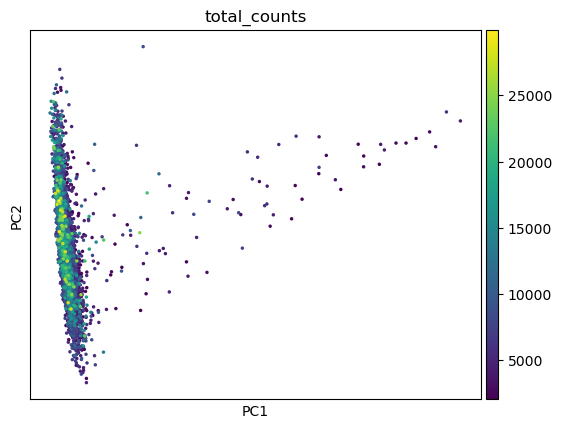

In [58]:
sc.pl.pca(rna, color="total_counts")

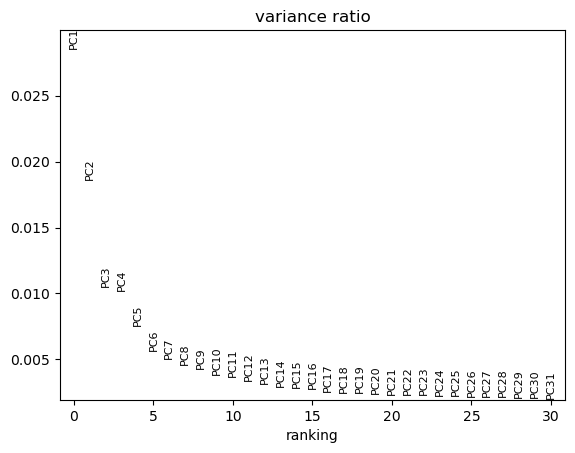

In [60]:
sc.pl.pca_variance_ratio(rna)

In [61]:
sc.pp.neighbors(rna,n_pcs=15)

In [62]:
sc.tl.umap(rna)

In [85]:
sc.tl.leiden(rna, resolution=1)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


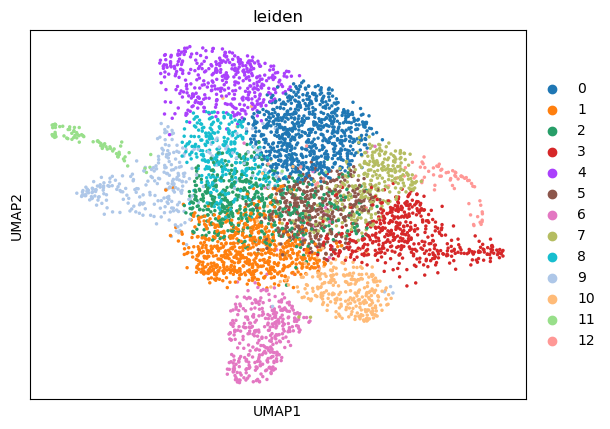

In [86]:
sc.pl.umap(rna, color='leiden')

## Differential expressed genes

In [87]:
sc.tl.rank_genes_groups(rna, 'leiden', method='t-test')

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

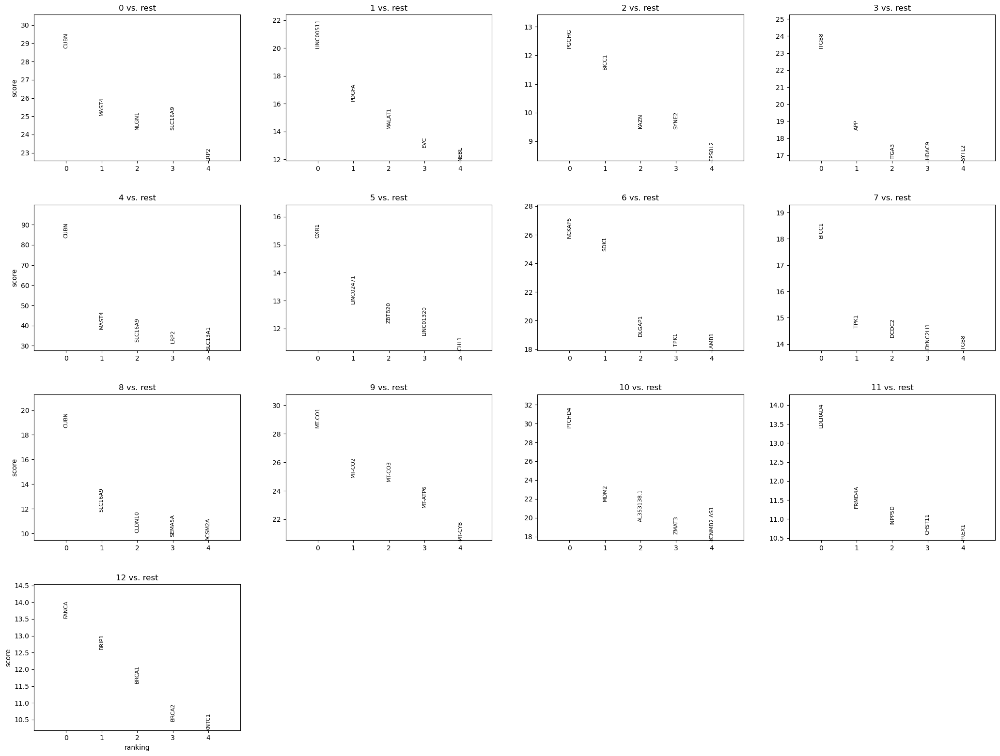

In [88]:
sc.pl.rank_genes_groups(rna, n_genes=5, sharey=False)

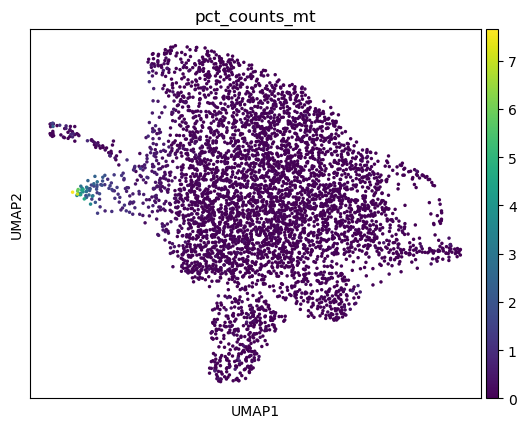

In [89]:
sc.pl.umap(rna, color='pct_counts_mt')

## Cell type annotation
Based on cell type marker from paper "Epigenetic regulation during cancer transitions across 11 tumour types" https://www.nature.com/articles/s41586-023-06682-5#additional-information

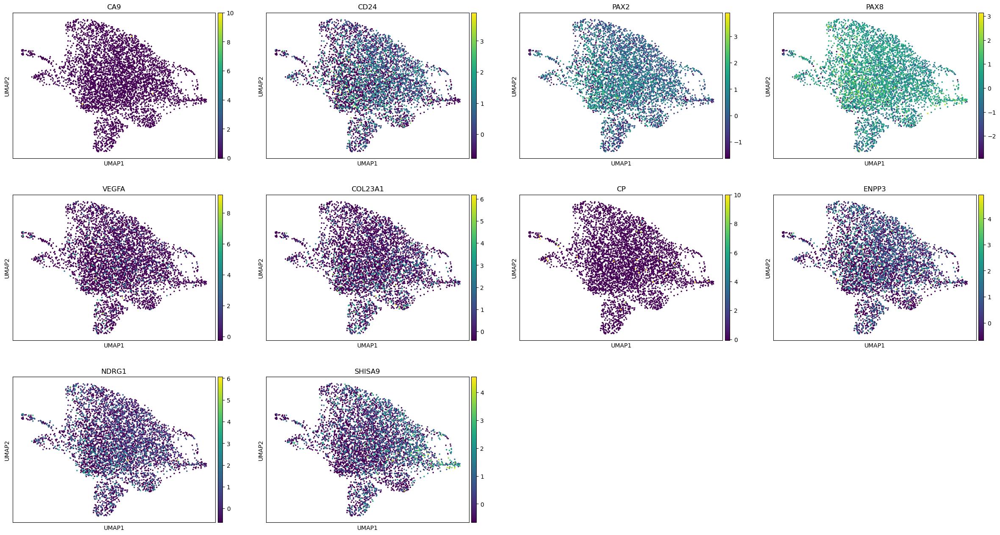

In [90]:
#Marker genes not found in dataset: LTL
marker_ccRCC = ["CA9","CD24","PAX2","PAX8","VEGFA","COL23A1","CP","ENPP3","NDRG1","SHISA9"]
sc.pl.umap(rna, color=marker_ccRCC)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


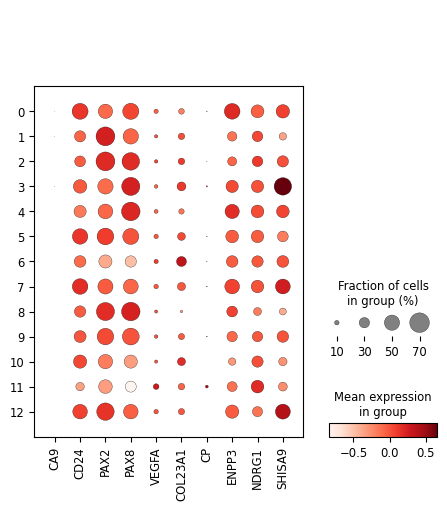

In [91]:
sc.pl.dotplot(rna, marker_ccRCC, groupby="leiden")

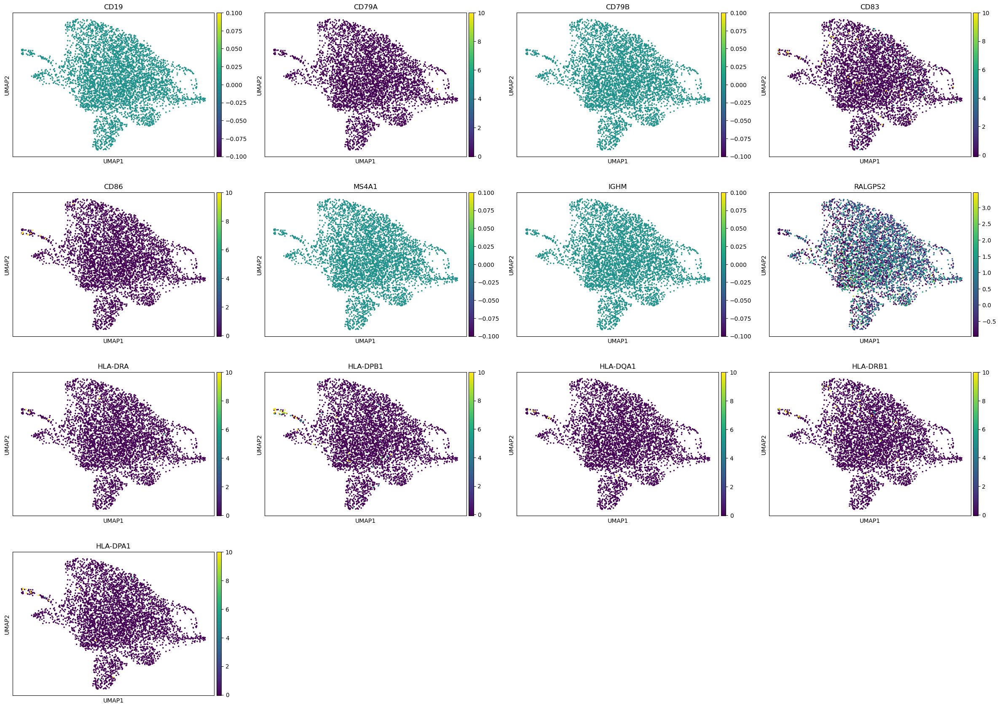

In [92]:
marker_B_cell= ["CD19", "CD79A", "CD79B", "CD83", "CD86", "MS4A1", "IGHM", 
                "RALGPS2", "HLA-DRA", "HLA-DPB1", "HLA-DQA1", "HLA-DRB1", "HLA-DPA1"]
sc.pl.umap(rna, color=marker_B_cell)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


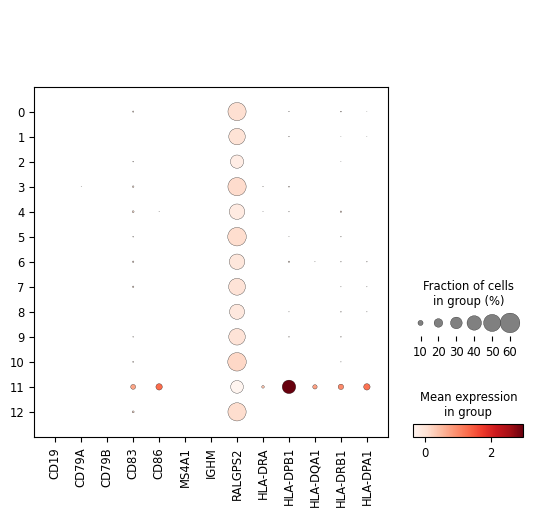

In [93]:
sc.pl.dotplot(rna, marker_B_cell, groupby="leiden")

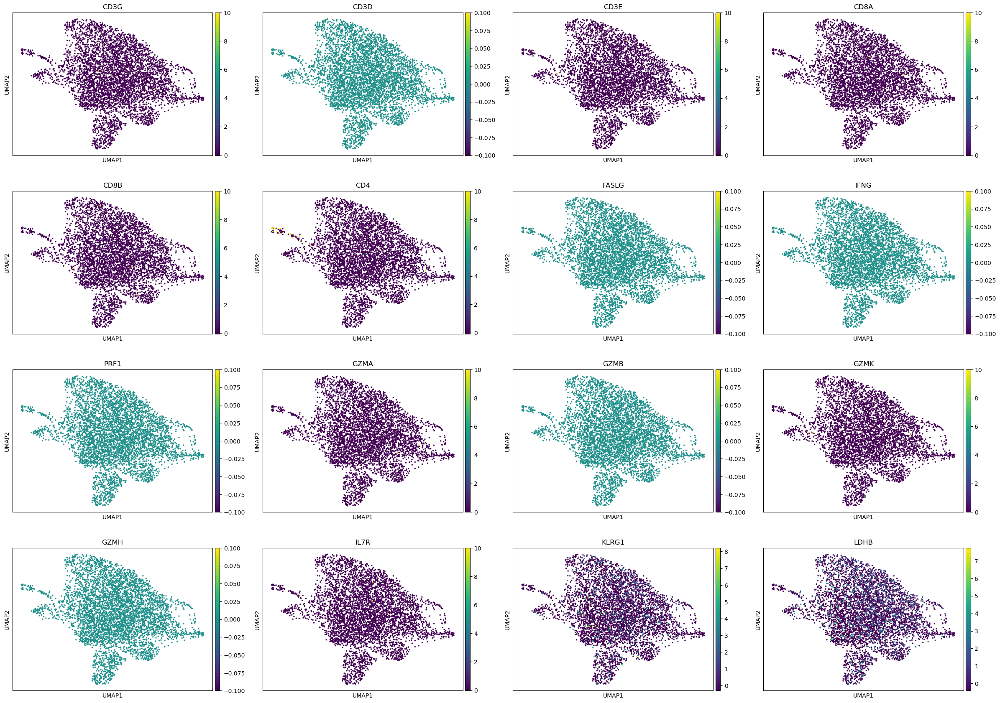

In [94]:
marker_T_cell = ["CD3G","CD3D","CD3E","CD8A","CD8B","CD4","FASLG","IFNG","PRF1",
                 "GZMA","GZMB","GZMK","GZMH","IL7R","KLRG1","LDHB"]
sc.pl.umap(rna, color=marker_T_cell)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


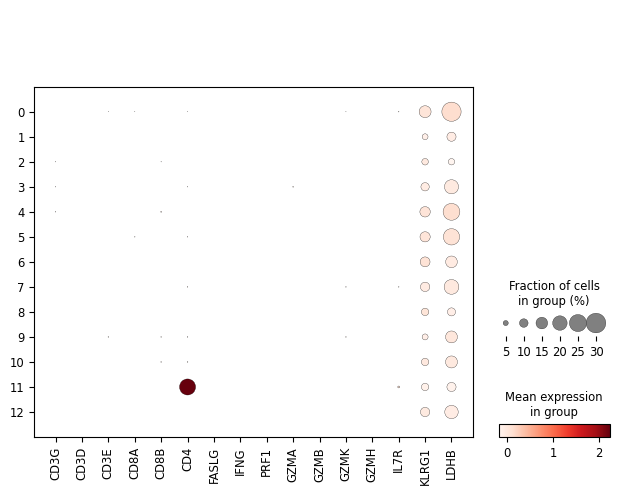

In [95]:
sc.pl.dotplot(rna, marker_T_cell, groupby="leiden")

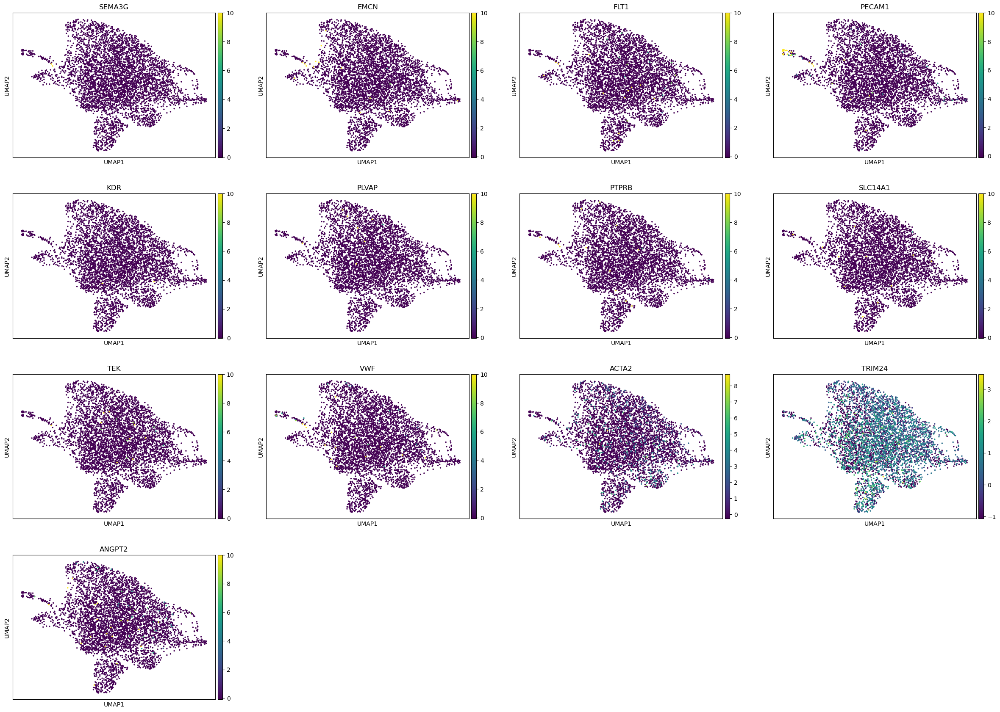

In [96]:
markers_endothelial=["SEMA3G","EMCN","FLT1","PECAM1","KDR","PLVAP","PTPRB","SLC14A1","TEK",
                     "VWF","ACTA2","TRIM24","ANGPT2"]
sc.pl.umap(rna, color=markers_endothelial)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


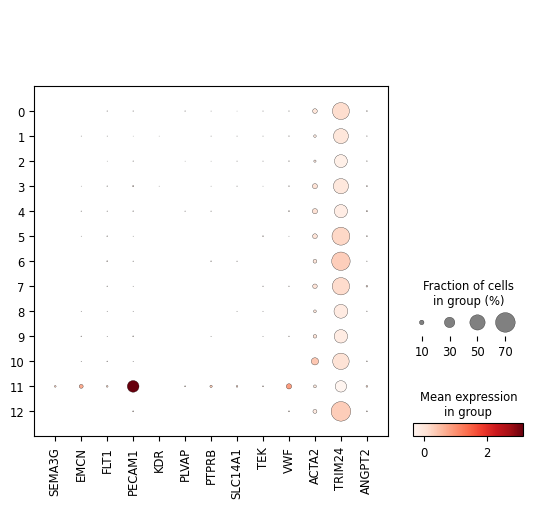

In [97]:
sc.pl.dotplot(rna, markers_endothelial, groupby="leiden")

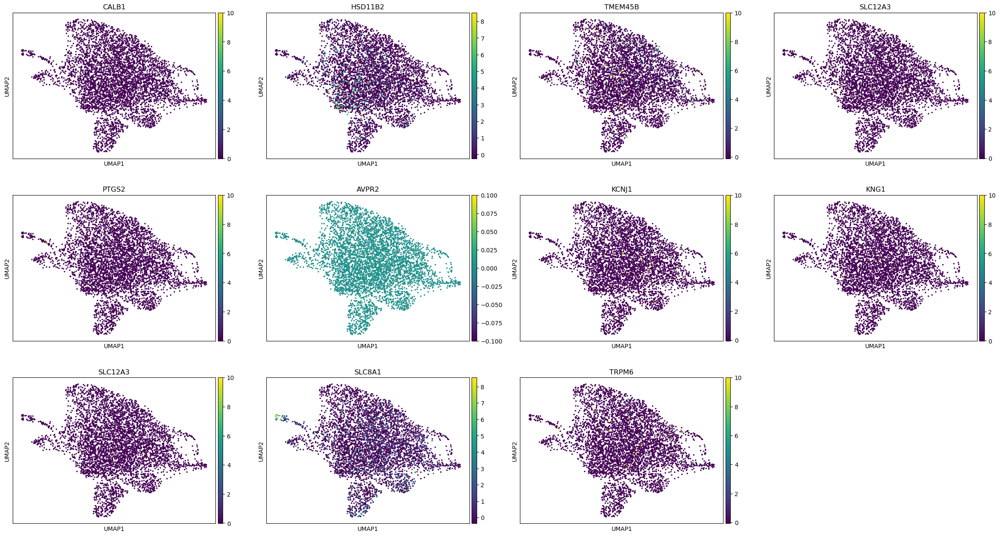

In [98]:
markers_kidney_tubule= ["CALB1", "HSD11B2", "TMEM45B", "SLC12A3", "PTGS2", 
                        "AVPR2", "KCNJ1", "KNG1", "SLC12A3", "SLC8A1", "TRPM6"]
sc.pl.umap(rna, color=markers_kidney_tubule)

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


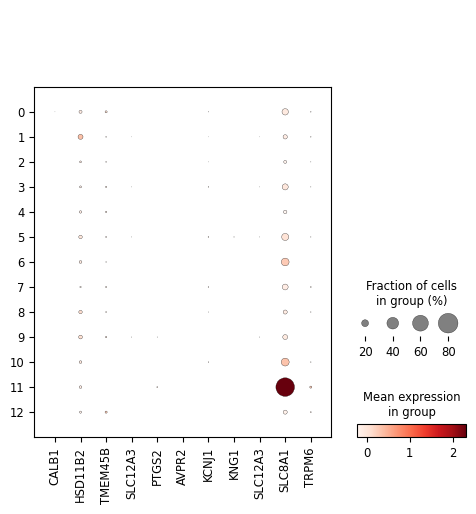

In [99]:
sc.pl.dotplot(rna, markers_kidney_tubule, groupby="leiden")

In [103]:
#Rename clusters:
new_cluster_names = {
    "0": "cancer", "1": "cancer", "2": "cancer", "3": "cancer", "4": "cancer",
    "5": "cancer", "6": "cancer",
    "7": "cancer", "8": "cancer",
    "9":"cancer","10":"cancer",
    "11":"healthy","12":"cancer"}

rna.obs['celltype'] = [new_cluster_names[clust] for clust in rna.obs.leiden.astype("str").values.tolist()]


In [107]:
rna.obs['celltype'].value_counts()

cancer     4758
healthy      74
Name: celltype, dtype: int64

/Users/kschmid/miniconda3/envs/py3_10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


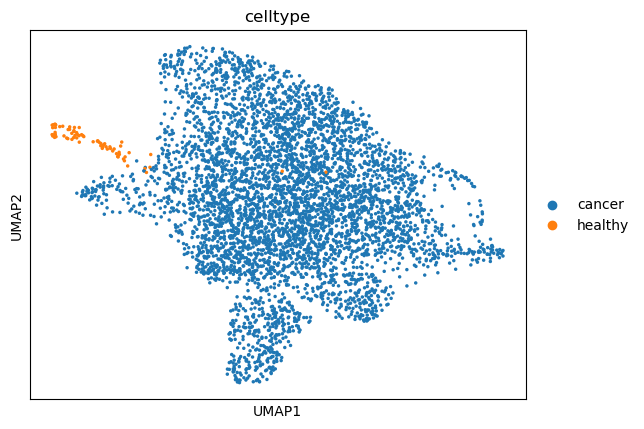

In [104]:
sc.pl.umap(rna, color='celltype')

In [105]:
cell_annot = pd.DataFrame({'barcode' : rna.obs.index.to_list(),
                    'cell_type' : rna.obs.celltype})

In [106]:
cell_annot.to_csv("celltype_annotation_exp2.csv")